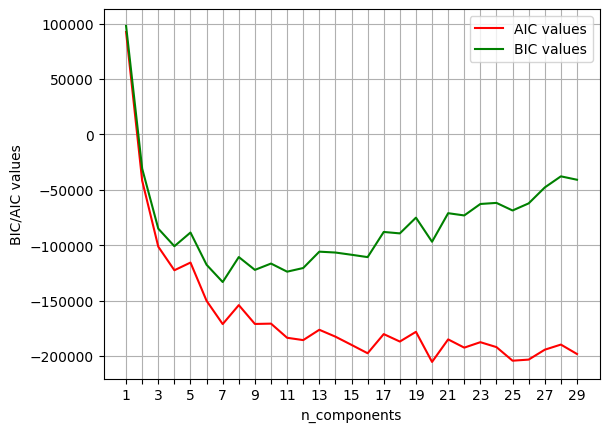

optim_cluster_AIC: 7

optim_cluster_BIC: 7 

optim_cluster_line: 1 

Optimal GMM model number of components: 7 



C:\Users\nitro\AppData\Local\Temp\ipykernel_4924\3916266298.py:52: DeprecationWarning: Arrays of 2-dimensional vectors are deprecated. Use arrays of 3-dimensional vectors instead. (deprecated in NumPy 2.0)
  optim_clusters_AIC = np.argmax(np.abs(np.cross(points_AIC-P1_AIC,Pn_AIC-P1_AIC))
C:\Users\nitro\AppData\Local\Temp\ipykernel_4924\3916266298.py:60: DeprecationWarning: Arrays of 2-dimensional vectors are deprecated. Use arrays of 3-dimensional vectors instead. (deprecated in NumPy 2.0)
  optim_clusters_BIC = np.argmax(np.abs(np.cross(points_BIC-P1_BIC,Pn_BIC-P1_BIC))


In [10]:
from sklearn.mixture import GaussianMixture as GMM
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer

GMM_models = [GMM(n_components = i, covariance_type = "full", random_state = 42, n_init = 10, reg_covar = 1e-6) for i in range(1,30)]
AIC_VALS = []
BIC_VALS = []
df_numerical = df_cluster.select_dtypes(include = ["number"]).drop(columns = ["slme", "slme_10","labels"])

scaler = StandardScaler()
mean_Scaler = SimpleImputer()
df_final_transform = mean_Scaler.fit_transform(df_numerical)
df_numerical_standard = scaler.fit_transform(df_final_transform)
pca = PCA(n_components = 30)
data_nd = pca.fit(df_numerical_standard)
optim_components = np.searchsorted(pca.explained_variance_ratio_.cumsum(),0.9)+1
pca = PCA(n_components = optim_components)
data_nd  = pca.fit_transform(df_numerical_standard)
df_nd = pd.DataFrame(data_nd, columns = [f"PCA{i}" for i in range(0,data_nd.shape[1])])



for gmm_model in GMM_models:
    gmm_model.fit(df_numerical_standard)
    BIC_VALS.append(gmm_model.bic(df_numerical_standard))  
    AIC_VALS.append(gmm_model.aic(df_numerical_standard))


X_constraints = np.arange(1,len(GMM_models)+1)
plt.plot(X_constraints, AIC_VALS, label = "AIC values", color = "r", linestyle = "-"  )
plt.plot(X_constraints, BIC_VALS , label = "BIC values", color =  "g", linestyle = "-")
plt.ylabel("BIC/AIC values")
plt.xlabel("n_components")
plt.xticks(X_constraints, labels = [str(i) if i%2 == 1 else "" for i in range(1, 30)])
plt.legend()
plt.grid(visible = "true")
plt.show()


np_AIC = np.array(AIC_VALS, dtype = float)
np_BIC = np.array(BIC_VALS , dtype = float)

np_AIC = (np_AIC - np_AIC.min())/(np_AIC.max() - np_AIC.min())
np_BIC = (np_BIC - np_BIC.min())/(np_BIC.max() - np_BIC.min())
cluster_num_normalized = np.linspace(0,1,29)

points_AIC = np.array([(cluster_num_normalized[i], np_AIC[i]) for i in range(0,len(np_AIC))], dtype = float)
P1_AIC = points_AIC[0]
Pn_AIC = points_AIC[-1]

optim_clusters_AIC = np.argmax(np.abs(np.cross(points_AIC-P1_AIC,Pn_AIC-P1_AIC))
                                  /np.linalg.norm(Pn_AIC-P1_AIC))+1

points_BIC = np.column_stack((cluster_num_normalized, np_BIC))

P1_BIC = points_BIC[0]
Pn_BIC = points_BIC[-1]

optim_clusters_BIC = np.argmax(np.abs(np.cross(points_BIC-P1_BIC,Pn_BIC-P1_BIC))
                                  /np.linalg.norm(Pn_BIC-P1_BIC))+1


optim_cluster_number = np.argmax(np.abs(np_AIC-cluster_num_normalized))+1



print(f"optim_cluster_AIC: {optim_clusters_AIC}\n")
print(f"optim_cluster_BIC: {optim_clusters_BIC} \n")
print(f"optim_cluster_line: {optim_cluster_number} \n")

optim_cluster_num = min(optim_clusters_AIC,optim_clusters_BIC)

optim_GMM_model  = GMM(n_components = optim_cluster_num, covariance_type = "full", random_state = 42, n_init = 10)

print(f"Optimal GMM model number of components: {optim_cluster_num} \n")














0.04115349978882069
(44, 44) (44, 44)
(44, 44) (44, 44)
(44, 44) (44, 44)
(44, 44) (44, 44)
(44, 44) (44, 44)
(44, 44) (44, 44)
(44, 44) (44, 44)


C:\Users\nitro\AppData\Local\Temp\ipykernel_4924\2333943126.py:46: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  plt.scatter(cluster.values[:,0],cluster.values[:,1],alpha = 0.5, c= colors[i], label = f"Cluster {i+1}")


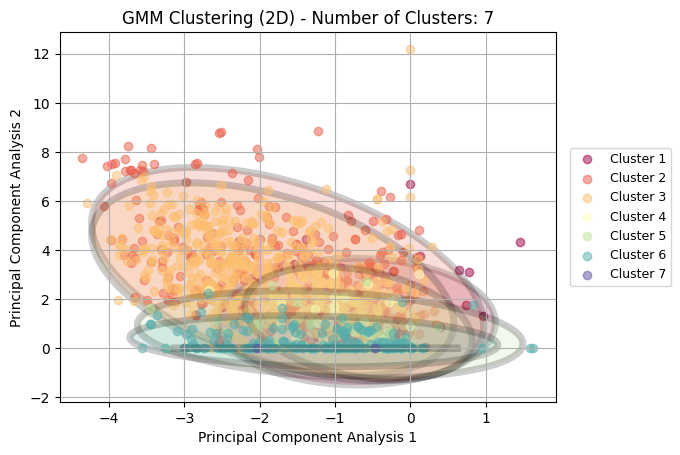

<Figure size 640x480 with 0 Axes>

In [11]:
#Once we have determined the optimal GMM_model to use, we follow similar pipline for kmeans
#Split data into clusters based on GMM_model
#plot results using fig, ax and continue

from sklearn.decomposition import PCA
from scipy import linalg
from sklearn import metrics



optim_GMM_model.fit(df_numerical_standard)
optim_GMM_means = optim_GMM_model.means_
optim_GMM_labels = optim_GMM_model.predict(df_numerical_standard)
optim_GMM_covariances = optim_GMM_model.covariances_
df_numerical["labels"] = optim_GMM_labels

grouped_values = df_numerical.groupby("labels")


print(metrics.silhouette_score(df_numerical_standard,optim_GMM_labels))



plt.xlabel("Principal Component Analysis 1")
plt.ylabel("Principal Component Analysis 2")
plt.title(f"GMM Clustering (2D) - Number of Clusters: {optim_GMM_model.n_components}")

scale_matrix = np.vstack([scaler.scale_[i] * scaler.scale_ for i in range(len(scaler.scale_))])
colors = [plt.cm.Spectral(each) for each in np.linspace(0, 1, optim_GMM_model.n_components)] 
color_str = [f'rgba({int(r*255)}, {int(g*255)}, {int(b*255)}, {int(a*255)})' for r,g,b,a in colors]




for i, (mean, covariance, (label,cluster)) in enumerate(zip(optim_GMM_means, optim_GMM_covariances, grouped_values)):
    print(covariance.shape,scale_matrix.shape)
    scaled_covariance = covariance * scale_matrix
    angle_param = np.linspace(0,2*np.pi,360)
    rotation_vec = np.vstack((np.cos(angle_param),np.sin(angle_param)))
    eigen_val, eigen_vector = linalg.eigh(scaled_covariance[0:2,0:2])
    scaled_mean = mean @ np.diag(scaler.scale_)+scaler.mean_
    ellipse = scaled_mean[:,np.newaxis][0:2,:] + eigen_vector @ np.diag(eigen_val**0.5*np.sqrt(5.992)) @ rotation_vec    
 
    plt.fill(ellipse[0,:], ellipse[1,:], c= colors[i],
                          alpha=0.2, edgecolor = 'k', linewidth = 5)
    plt.scatter(cluster.values[:,0],cluster.values[:,1],alpha = 0.5, c= colors[i], label = f"Cluster {i+1}")
    
    plt.grid()
    

    
    
plt.legend(loc = 'center right', bbox_to_anchor = (1.245,0.5), fontsize = 9)
plt.show()
plt.tight_layout()


    

    

    
    

    
   

   



#GMM_clusters = 





In [12]:

import numpy as np
from scipy import linalg
import plotly.graph_objects as go

# Create figure
fig = go.Figure()

# Set 3D axis labels and title
fig.update_layout(
    title=dict(text = f"GMM Clustering (3D) - Number of Clusters: {optim_GMM_model.n_components}", 
               x  = 0.5,),
               
    scene=dict(
        xaxis_title="Principal Component 1",
        yaxis_title="Principal Component 2",
        zaxis_title="Principal Component 3"
    ),
    width = 1000,
    height = 800
)

# Create rotation grid
theta = np.linspace(0, 2*np.pi, 180)
phi = np.linspace(0, np.pi, 180)

x = np.outer(np.sin(phi), np.cos(theta)).ravel()
y = np.outer(np.sin(phi), np.sin(theta)).ravel()
z = np.outer(np.cos(phi), np.ones(180)).ravel()

rotation_vec = np.vstack([x, y, z])

fig.update_layout(
    scene = dict(
        xaxis = dict(range = [-5,2]),
        yaxis = dict(range = [-1.5,8 ]),
        zaxis = dict(range = [-3,6])
    )
)

# Loop over clusters
for i, (mean, covariance, (label, cluster)) in enumerate(zip(optim_GMM_means, optim_GMM_covariances, grouped_values)):
    print(covariance.shape, scale_matrix.shape)
    
    # Scale covariance
    scaled_covariance = covariance * scale_matrix

    # Eigen decomposition
    eigen_val, eigen_vector = linalg.eigh(scaled_covariance[0:3, 0:3])

    # Scale mean
    scaled_mean = mean @ np.diag(scaler.scale_) + scaler.mean_

    # Compute ellipsoid points
    ellipse = scaled_mean[:, np.newaxis][0:3, :] + eigen_vector @ np.diag(np.sqrt(np.maximum(0.2,eigen_val) * 5.992)) @ rotation_vec



    # Plot ellipsoid surface using Mesh3d
    fig.add_trace(go.Surface(
        x=ellipse[0, :].reshape(180,180),
        y=ellipse[1, :].reshape(180,180),
        z=ellipse[2, :].reshape(180,180),
        opacity=0.3,
        name=f'Cluster {i+1} Surface',
        surfacecolor = np.zeros((180,180)),
        colorscale = [[0, color_str[i]], [1, color_str[i]]],
        showscale = False,
        hovertemplate=f'<b>Gaussian Cluster {i} Ellipse</b><br>X: %{{x:.3f}}<br>Y: %{{y:.3f}}<br>Z: %{{z:.3f}}<extra></extra>',
        showlegend = True
    ))

    # Plot cluster points
    fig.add_trace(go.Scatter3d(
        x=cluster.values[:, 0],
        y=cluster.values[:, 1],
        z=cluster.values[:, 2],
        mode = 'markers',
        marker=dict(size=5, color=color_str[i], opacity=0.9),
        name = f'Cluster {i+1} Points',
        hovertemplate = f'<b>Cluster {i}</b><br>'
        'PC1: %{x:.3f}<br>'
        'PC2: %{y:.3f}<br>'
        'PC3: %{z:.3f}<extra></extra>',
        showlegend = True,
    ))



    """
    fig.add_trace(go.Scatter3d(
        x=[scaled_mean[0]],
        y=[scaled_mean[1]],
        z=[scaled_mean[2]]
       
        #marker=dict(size=12, color=colors[i], symbol='x')
    ))
    """
    

# Show grid
fig.show()

(44, 44) (44, 44)
(44, 44) (44, 44)
(44, 44) (44, 44)
(44, 44) (44, 44)
(44, 44) (44, 44)
(44, 44) (44, 44)
(44, 44) (44, 44)
